# importado de Librerias

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="darkgrid")

# Definición de funciones auxiliares

In [2]:

def ref_leer_componentes(atomo):
    '''     
    atomo : Linea de texto proveniente de un archivo refstructureFF.out de donde se extraen las componentes cartesinas a una lista [x,y,z].
    '''
    return  [float(atomo.split()[0]), float(atomo.split()[1]), float(atomo.split()[2])]


def read_trajs(path : str) -> dict:
    '''
    Esta funcion lee la direccion con las salidas de la dinamica molecular (concatenada) y las guarda en un diccionario.
    '''
    df = {}
    dfs = []
    sticks = ['traj_stick.out', 'traj_stickearly.out', 'traj_sticklate.out']
    for stick in sticks:    
        if os.path.getsize(path + stick) > 0:
            dfs.append(pd.read_csv(path + stick, delim_whitespace=True, header=None))
    if len(dfs) == 0:
        df['stick'] = dfs[0]
    if len(dfs) > 0:
        df['stick'] = pd.concat(dfs, ignore_index=True)
    del(dfs)
    df['stick'].columns = ['ncoup', 'nt', 't', 'nreb', 'nsubh', 'ptad', 'V']
    df['stick'] = df['stick'].sort_values(by='ncoup')
    df['stick'].columns = ['ncoup', 'nt', 't', 'nreb', 'nsubh', 'ptad', 'V']

    df['admol'] = pd.read_csv(path + 'traj_admol.out', delim_whitespace=True, header=None)
    df['admol'].columns = ['ncoup','nt','t','rmax','V','vint']
    df['refl'] = pd.read_csv(path + 'traj_refl.out', delim_whitespace=True, header=None)
    df['refl'].columns = ['ncoup','nt','t','nreb','V','tlf'] 
    return df

def read_CMs(path : str) -> dict:
    '''
    Esta funcion lee la direccion con las salidas de la dinamica molecular (concatenada) y las guarda en un diccionario.
    '''
    df = {}
    dfs = []
    sticks = ['traj_stick.out', 'traj_stickearly.out', 'traj_sticklate.out']
    for stick in sticks:    
        if os.path.getsize(path + stick) > 0:
            dfs.append(pd.read_csv(path + stick))
    if len(dfs) == 0:
        df['stick'] = dfs[0]
    if len(dfs) > 0:
        df['stick'] = pd.concat(dfs, ignore_index=True)
    del(dfs)
    df['admol'] = pd.read_csv(path + 'traj_admol.out')
    df['refl'] = pd.read_csv(path + 'traj_refl.out')

    return df


# Lectura de datos

In [3]:
Pt_ref = {}
with open('data/refstructureFF.out') as f:
            ref = f.readlines()


for i in range(3,54):
    Pt_ref[str(i-2)] =  ref_leer_componentes(ref[i])    

In [4]:
path50  = 'data/01 - NN15 concat MD/50Koutputs/'
path300 = 'data/01 - NN15 concat MD/300Koutputs/'
path550 = 'data/01 - NN15 concat MD/550Koutputs/'
energias =  ['Ei0.4_outputs/','Ei0.6_outputs/','Ei0.8_outputs/','Ei1.0_outputs/','Ei1.2_outputs/','Ei1.4_outputs/']

conf_files = ['config_admol.xyz',
'config_refl.xyz',
'config_stick.xyz',
'config_stickearly.xyz',
'config_sticklate.xyz']


energias =  ['Ei0.4_outputs/','Ei0.6_outputs/','Ei0.8_outputs/','Ei1.0_outputs/','Ei1.2_outputs/','Ei1.4_outputs/']
trajs50 = {}
trajs300 = {}
trajs550 = {}
for Ei in energias:
    trajs50[str(Ei[2:5])] = read_trajs(path50+Ei)
    trajs300[str(Ei[2:5])] = read_trajs(path300+Ei)
    trajs550[str(Ei[2:5])] = read_trajs(path550+Ei)
E_incidencia = ['0.4','0.6','0.8','1.0','1.2','1.4']

E_incidencia2 = ['0_4','0_6','0_8','1_0','1_2','1_4']
tipo_traj = ['stick', 'admol', 'refl']


In [5]:
def read_CMs(path : str, file : str) -> dict:
    '''
    Esta funcion lee la direccion con ... las guarda en un diccionario.
    '''
    df = {}
    dfs = []
    sticks = [f'{file}_stick_CH4_cm.out', f'{file}_stickearly_CH4_cm.out', f'{file}_sticklate_CH4_cm.out']
    for stick in sticks:
        if not os.path.exists(path + stick):
            print(f"El archivo '{stick}' no existe en la ubicación '{path}'")
            pass    
        elif os.path.getsize(path + stick) > 0:
            dfs.append(pd.read_csv(path + stick))
    if len(dfs) == 0:
        df['stick'] = dfs[0]
    if len(dfs) > 0:
        df['stick'] = pd.concat(dfs, ignore_index=True)
    del(dfs)
    df['admol'] = pd.read_csv(path + f'{file}_admol_CH4_cm.out')
    df['refl'] = pd.read_csv(path + f'{file}_refl_CH4_cm.out')

    return df

def read_dPt(path : str, file : str) -> dict:
    '''
    Esta funcion lee la direccion con ... las guarda en un diccionario.
    '''
    df = {}
    dfs = []
    sticks = [f'{file}_stick_dPt.out', f'{file}_stickearly_dPt.out', f'{file}_sticklate_dPt.out']
    for stick in sticks:
        if not os.path.exists(path + stick):
            print(f"El archivo '{stick}' no existe en la ubicación '{path}'")
            pass    
        elif os.path.getsize(path + stick) > 0:
            dfs.append(pd.read_csv(path + stick))
    if len(dfs) == 0:
        df['stick'] = dfs[0]
    if len(dfs) > 0:
        df['stick'] = pd.concat(dfs, ignore_index=True)
    del(dfs)
    df['admol'] = pd.read_csv(path + f'{file}_admol_dPt.out')
    df['refl'] = pd.read_csv(path + f'{file}_refl_dPt.out')

    return df

In [6]:
CMs50 = {}
CMs300 = {}
CMs550 = {}


for Ei,E_path in zip(E_incidencia2, energias):
    file = '50K_'+ Ei
    CMs50[Ei] = read_CMs(path50+E_path,file)

for Ei,E_path in zip(E_incidencia2, energias):
    file = '300K_'+ Ei
    CMs300[Ei] = read_CMs(path300+E_path,file)

for Ei,E_path in zip(E_incidencia2, energias):
    file = '550K_'+ Ei
    CMs550[Ei] = read_CMs(path550+E_path,file)

El archivo '50K_0_4_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei0.4_outputs/'
El archivo '50K_0_6_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei0.6_outputs/'


El archivo '50K_0_8_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei0.8_outputs/'
El archivo '50K_1_0_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei1.0_outputs/'
El archivo '50K_1_2_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei1.2_outputs/'
El archivo '50K_1_4_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei1.4_outputs/'
El archivo '300K_0_4_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.4_outputs/'
El archivo '300K_0_4_sticklate_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.4_outputs/'
El archivo '300K_0_6_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.6_outputs/'
El archivo '300K_0_8_stickearly_CH4_cm.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.8_outputs/'
El archivo '300K_

In [7]:
# Inicializa una lista para almacenar los DataFrames
data_frames = []

# Itera por los nombres de los diccionarios y sus respectivas temperaturas
for name, temperature in [('CMs50', 50), ('CMs300', 300), ('CMs550', 550)]:
    # Obtiene el diccionario correspondiente
    cm_dict = globals()[name]
    
    # Inicializa listas para almacenar los datos
    ei_values = []
    kind_values = []
    data_values = []

    # Itera por las claves del primer nivel ('0_4', '0_6', '0_8', '1_0', '1_2', '1_4')
    for ei_key in ['0_4', '0_6', '0_8', '1_0', '1_2', '1_4']:
        ei = ei_key
        # Itera por las claves del segundo nivel ('stick', 'admol', 'refl')
        for kind_key in ['stick', 'admol', 'refl']:
            kind = kind_key
            # Accede a los datos correspondientes del diccionario anidado y agrega 'Ei', 'kind', y 'T'
            data = cm_dict[ei_key][kind_key]
            data['Ei'] = ei
            data['kind'] = kind
            data['T'] = temperature
            # Agrega los valores a las listas
            data_values.append(data)

    # Concatena los DataFrames internos en un solo DataFrame y agrega a la lista de DataFrames
    df = pd.concat(data_values, ignore_index=True)
    data_frames.append(df)

# Concatena los DataFrames de los diferentes diccionarios en un solo DataFrame
CMs = pd.concat(data_frames, ignore_index=True)
CMs = CMs.assign(
    dx = CMs.x - CMs.x_ini,
    dy = CMs.y - CMs.y_ini,
    dz = CMs.z - CMs.z_ini
)
CMs['Ei'] = CMs.Ei.replace('_','.', regex=True)
CMs=CMs.sort_values(by=['T','Ei','ntraj'])


In [8]:
CMs

,ntraj,x,y,z,x_ini,y_ini,z_ini,Ei,kind,T,dx,dy,dz
8,1,-7.573463,-3.829627,3.856871,1.950330,0.114865,9.000000,0.4,admol,50,-9.523792,-3.944492,-5.143129
9,2,11.976364,4.553305,4.918196,7.984705,4.129872,8.999737,0.4,admol,50,3.991659,0.423433,-4.081541
10,3,12.835998,7.025249,3.283637,7.498847,7.571687,9.000016,0.4,admol,50,5.337150,-0.546438,-5.716380
11,4,-9.176993,7.262731,1.601437,1.498144,6.273883,9.000144,0.4,admol,50,-10.675137,0.988848,-7.398707
12,5,14.295663,12.107242,4.228211,5.131917,7.745245,8.999761,0.4,admol,50,9.163747,4.361997,-4.771550
...,...,...,...,...,...,...,...,...,...,...,...,...,...
181289,9996,17.818435,4.767102,9.003729,6.437670,4.634307,9.000334,1.4,refl,550,11.380765,0.132796,0.003395
181290,9997,-3.261758,5.610640,9.003780,0.462218,5.943855,8.999683,1.4,refl,550,-3.723977,-0.333216,0.004097
181291,9998,13.786411,2.568372,9.000945,6.943400,2.969842,8.999883,1.4,refl,550,6.843011,-0.401470,0.001062
181292,9999,9.585734,1.113925,9.005288,4.736681,0.024274,9.000278,1.4,refl,550,4.849054,1.089651,0.005010


In [9]:
dPt50 = {}
dPt300 = {}
dPt550 = {}


for Ei,E_path in zip(E_incidencia2, energias):
    file = '50K_'+ Ei
    dPt50[Ei] = read_dPt(path50+E_path,file)

for Ei,E_path in zip(E_incidencia2, energias):
    file = '300K_'+ Ei
    dPt300[Ei] = read_dPt(path300+E_path,file)

for Ei,E_path in zip(E_incidencia2, energias):
    file = '550K_'+ Ei
    dPt550[Ei] = read_dPt(path550+E_path,file)

El archivo '50K_0_4_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei0.4_outputs/'
El archivo '50K_0_6_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei0.6_outputs/'


El archivo '50K_0_8_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei0.8_outputs/'
El archivo '50K_1_0_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei1.0_outputs/'
El archivo '50K_1_2_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei1.2_outputs/'
El archivo '50K_1_4_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/50Koutputs/Ei1.4_outputs/'
El archivo '300K_0_4_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.4_outputs/'
El archivo '300K_0_4_sticklate_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.4_outputs/'
El archivo '300K_0_6_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.6_outputs/'
El archivo '300K_0_8_stickearly_dPt.out' no existe en la ubicación 'data/01 - NN15 concat MD/300Koutputs/Ei0.8_outputs/'
El archivo '300K_1_0_stickearly_dPt.out' 

In [10]:
dPt550['0_4']['stick']

,ntraj,nat,dx,dy,dz
0,540,31,0.037321,-0.011414,-0.070543
1,540,32,0.020697,-0.051536,-0.067374
2,540,33,0.017050,-0.095423,-0.197891
3,540,34,0.004114,-0.141194,0.010440
4,540,35,0.233516,-0.017805,0.059852
...,...,...,...,...,...
289,6727,47,0.223031,-0.342960,-0.073000
290,6727,48,0.190714,-0.300947,-0.006634
291,6727,49,0.129371,-0.453102,0.235091
292,6727,50,0.080452,-0.261796,0.199290


In [11]:
# Inicializa una lista para almacenar los DataFrames
data_frames = []

# Itera por los nombres de los diccionarios y sus respectivas temperaturas
for name, temperature in [('dPt50', 50), ('dPt300', 300), ('dPt550', 550)]:
    # Obtiene el diccionario correspondiente
    pt_dict = globals()[name]
    
    # Inicializa listas para almacenar los datos
    ei_values = []
    kind_values = []
    data_values = []

    # Itera por las claves del primer nivel ('0_4', '0_6', '0_8', '1_0', '1_2', '1_4')
    for ei_key in ['0_4', '0_6', '0_8', '1_0', '1_2', '1_4']:
        ei = ei_key
        # Itera por las claves del segundo nivel ('stick', 'admol', 'refl')
        for kind_key in ['stick', 'admol', 'refl']:
            kind = kind_key
            # Accede a los datos correspondientes del diccionario anidado y agrega 'Ei', 'kind', y 'T'
            data = pt_dict[ei_key][kind_key]
            data['Ei'] = ei
            data['kind'] = kind
            data['T'] = temperature
            # Agrega los valores a las listas
            data_values.append(data)

    # Concatena los DataFrames internos en un solo DataFrame y agrega a la lista de DataFrames
    df = pd.concat(data_values, ignore_index=True)
    data_frames.append(df)

# Concatena los DataFrames de los diferentes diccionarios en un solo DataFrame
dPt = pd.concat(data_frames, ignore_index=True)

dPt['Ei'] = dPt.Ei.replace('_', '.', regex=True)



In [12]:
dPt

,ntraj,nat,dx,dy,dz,Ei,kind,T
0,2321,31,0.057324,-0.029630,-0.014623,0.4,stick,50
1,2321,32,0.038994,-0.050930,-0.024849,0.4,stick,50
2,2321,33,0.058371,-0.033094,-0.046881,0.4,stick,50
3,2321,34,0.006967,-0.054592,-0.011560,0.4,stick,50
4,2321,35,0.022585,0.006333,-0.010755,0.4,stick,50
...,...,...,...,...,...,...,...,...
3807169,10000,47,0.112930,-0.185896,0.205751,1.4,refl,550
3807170,10000,48,0.074581,-0.187840,0.225012,1.4,refl,550
3807171,10000,49,0.188025,-0.343139,0.044588,1.4,refl,550
3807172,10000,50,0.085309,-0.095192,-0.059902,1.4,refl,550


In [13]:
# Supongamos que tienes los diccionarios 'trajs50', 'trajs300' y 'trajs550'
trajs_dicts = {'trajs50': trajs50, 'trajs300': trajs300, 'trajs550': trajs550}

# Inicializa una lista para almacenar los DataFrames
data_frames = []

# Itera por los nombres de los diccionarios y sus respectivas temperaturas
for name, temperature in [('trajs50', 50), ('trajs300', 300), ('trajs550', 550)]:
    # Obtiene el diccionario correspondiente
    trajs_dict = trajs_dicts[name]
    
    # Inicializa listas para almacenar los datos
    ei_values = []
    kind_values = []
    data_values_trajs = []

    # Itera por las claves del primer nivel ('0.4', '0.6', '0.8', '1.0', '1.2', '1.4')
    for ei_key, ei_data in trajs_dict.items():
        ei = ei_key
        # Itera por las claves del segundo nivel ('stick')
        for kind_key in ['stick']:
            kind = kind_key
            # Accede a los datos correspondientes del diccionario anidado y agrega 'Ei', 'kind' y 'T'
            data = trajs_dict[ei_key][kind_key]
            data['Ei'] = ei
            data['kind'] = kind
            data['T'] = temperature
            # Agrega los valores a las listas
            data_values_trajs.append(data)

    # Concatena los DataFrames internos en un solo DataFrame y agrega a la lista de DataFrames
    df = pd.concat(data_values_trajs, ignore_index=True)
    data_frames.append(df)

# Concatena los DataFrames de los diferentes diccionarios en un solo DataFrame
trajs_all_stick = pd.concat(data_frames, ignore_index=True)

# Ahora tienes un DataFrame 'trajs_all' con las columnas 'Ei', 'kind', 'T' y los datos correspondientes.


In [14]:
trajs_all_stick

,ncoup,nt,t,nreb,nsubh,ptad,V,Ei,kind,T
0,2321,1510,0.3018,0,4,51,0.935684,0.4,stick,50
1,3384,1502,0.3002,0,4,49,1.049950,0.4,stick,50
2,3525,1610,0.3218,1,4,51,1.337092,0.4,stick,50
3,3611,1535,0.3068,0,1,49,1.287614,0.4,stick,50
4,5257,1504,0.3006,0,4,51,0.955718,0.4,stick,50
...,...,...,...,...,...,...,...,...,...,...
8245,9966,998,0.1994,1,4,51,3.587370,1.4,stick,550
8246,9980,895,0.1788,1,1,50,3.367813,1.4,stick,550
8247,9988,907,0.1812,0,3,49,3.354040,1.4,stick,550
8248,9993,1000,0.1998,1,2,50,2.708475,1.4,stick,550


# EDA

In [15]:
CMs.query('kind=="stick"')

,ntraj,x,y,z,x_ini,y_ini,z_ini,Ei,kind,T,dx,dy,dz
0,2321,3.805189,5.923794,2.184464,3.814189,6.036317,9.000246,0.4,stick,50,-0.009000,-0.112524,-6.815782
1,3384,3.376401,8.171360,2.229087,3.456709,8.083595,8.999917,0.4,stick,50,-0.080308,0.087764,-6.770830
2,3525,4.510600,6.067447,2.410150,4.334726,6.173559,8.999950,0.4,stick,50,0.175873,-0.106112,-6.589801
3,3611,5.046138,0.067817,2.122764,5.050829,0.083521,8.999741,0.4,stick,50,-0.004691,-0.015704,-6.876977
4,5257,3.492695,5.695708,2.176894,3.540413,5.669589,8.999763,0.4,stick,50,-0.047718,0.026120,-6.822869
...,...,...,...,...,...,...,...,...,...,...,...,...,...
172814,9966,5.282267,5.995685,1.567993,5.076473,6.044362,9.000052,1.4,stick,550,0.205794,-0.048677,-7.432059
172815,9980,3.930871,3.610789,2.073402,3.995535,3.620866,9.000008,1.4,stick,550,-0.064664,-0.010077,-6.926605
172816,9988,4.952412,0.333007,1.955501,4.801514,0.287496,8.999919,1.4,stick,550,0.150898,0.045511,-7.044418
172817,9993,2.517912,2.171995,1.921183,2.988844,2.235639,9.000137,1.4,stick,550,-0.470932,-0.063644,-7.078953


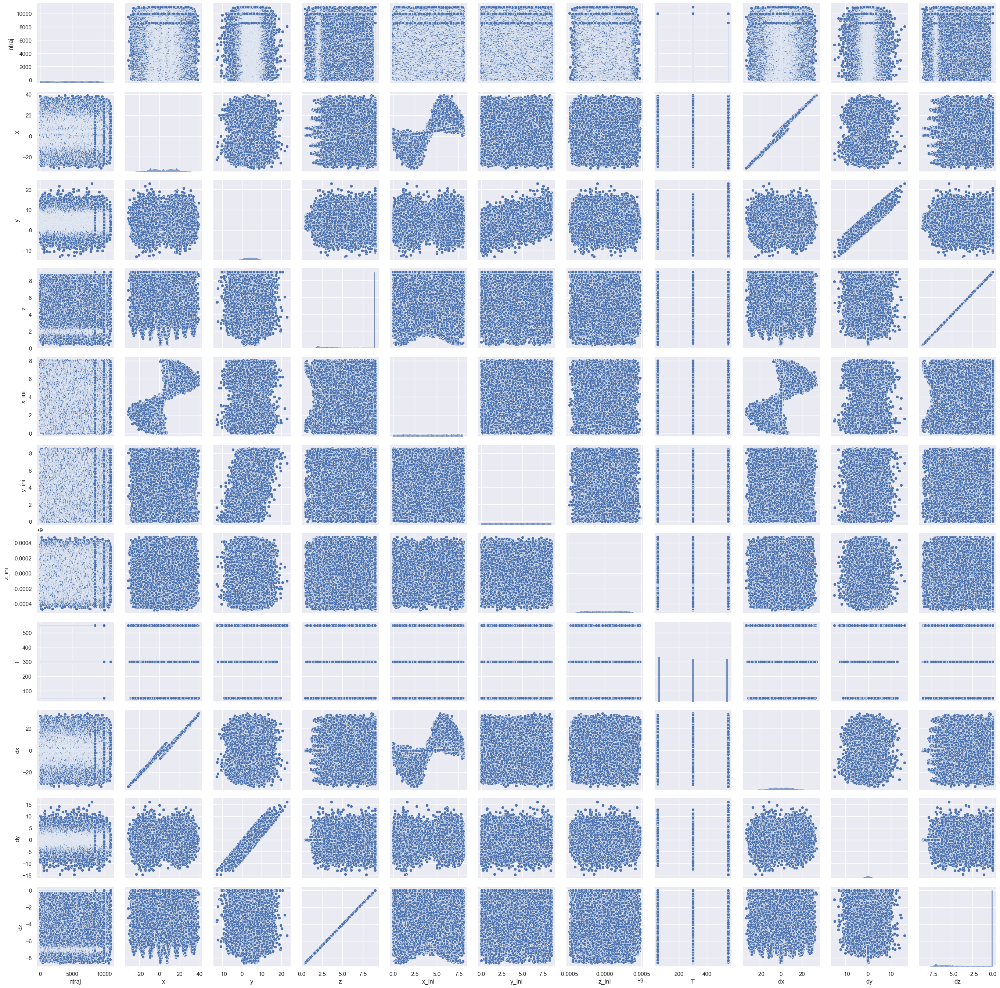

In [16]:
g = sns.PairGrid(CMs)
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

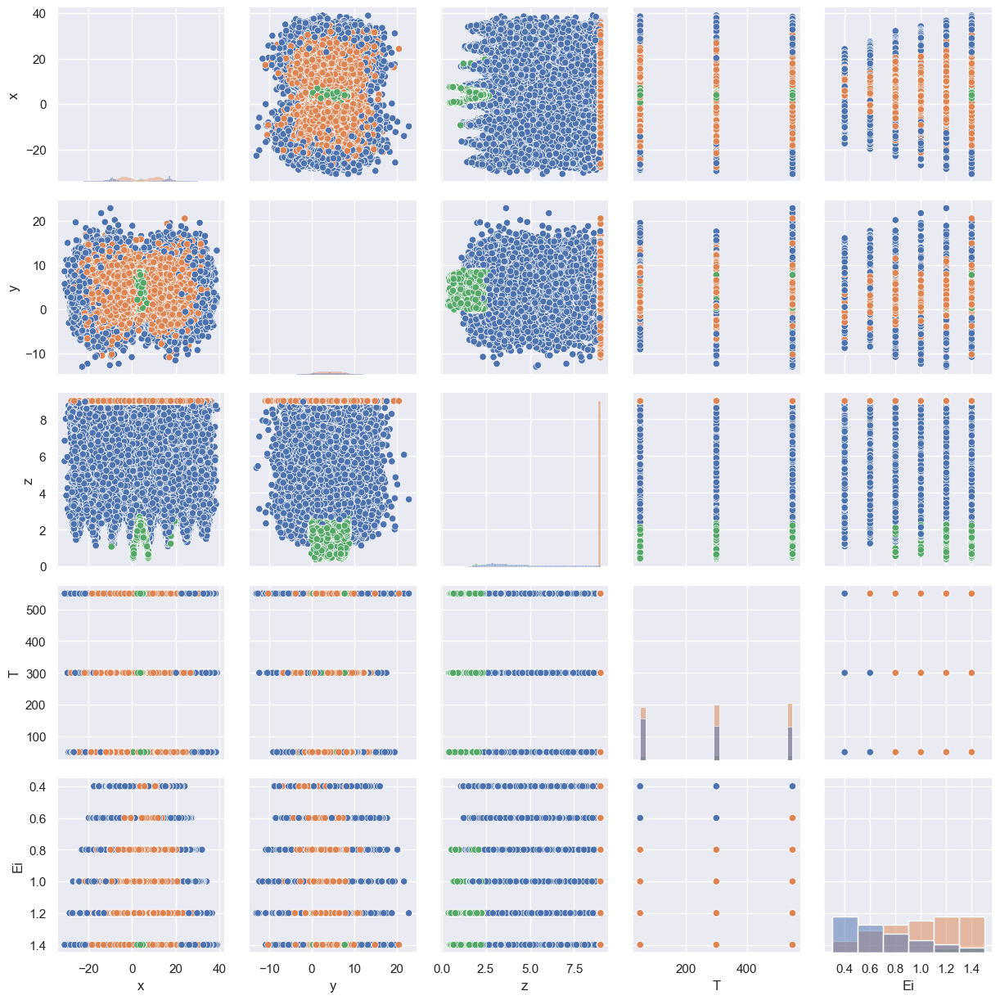

In [17]:
g = sns.PairGrid(CMs, vars=['x',	'y',	'z', 'T', 'Ei'], hue="kind")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

In [18]:
# g = sns.FacetGrid(CMs.query('kind !="refl"'), row="kind", col="Ei",hue='T', margin_titles=True, height=2.5)
# g.map(sns.scatterplot,'z','dz',alpha=0.3,s=10)

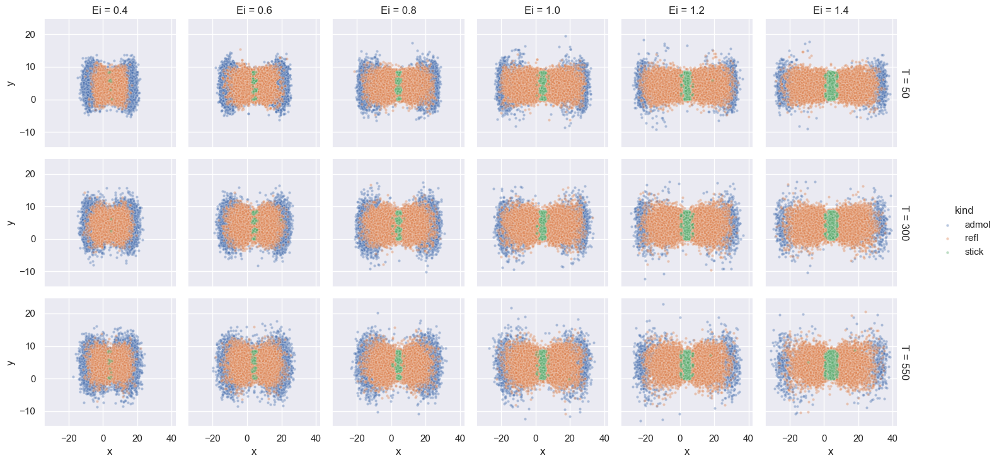

In [19]:
g = sns.FacetGrid(CMs, hue="kind", row="T",col='Ei', margin_titles=True, height=2.5)
g.map(sns.scatterplot,'x','y',alpha=0.4,s=10)
g.add_legend()

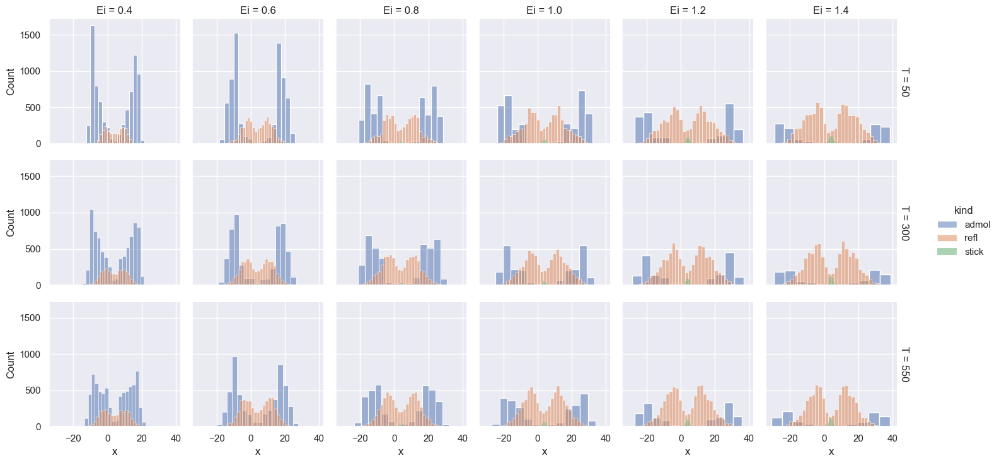

In [20]:
g = sns.FacetGrid(CMs, hue="kind", row="T",col='Ei', margin_titles=True, height=2.5)
g.map(sns.histplot,'x', alpha=0.5)
g.add_legend()

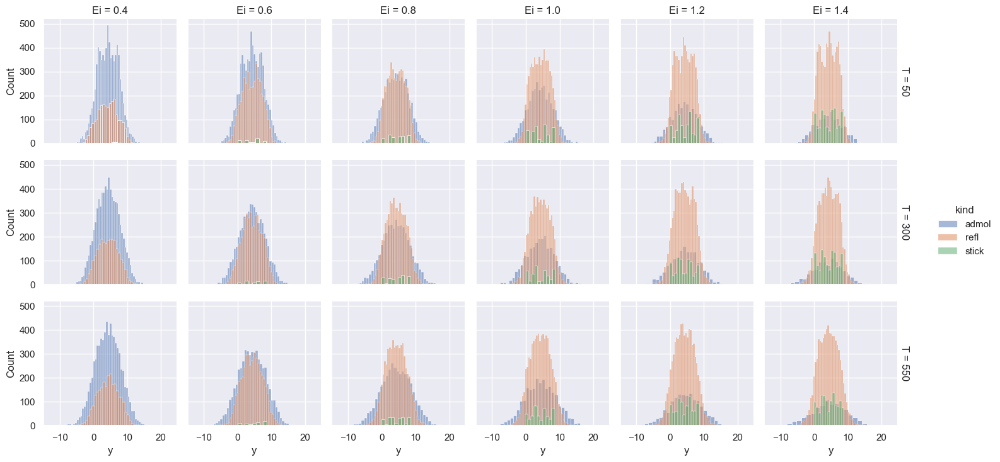

In [21]:
g = sns.FacetGrid(CMs, hue="kind", row="T",col='Ei', margin_titles=True, height=2.5)
g.map(sns.histplot,'y', alpha=0.5)
g.add_legend()

In [22]:
def hexbin(x, y, color, **kwargs):
    cmap = sns.light_palette(color, as_cmap=True)
    plt.hexbin(x, y, gridsize=30, cmap=cmap, **kwargs)

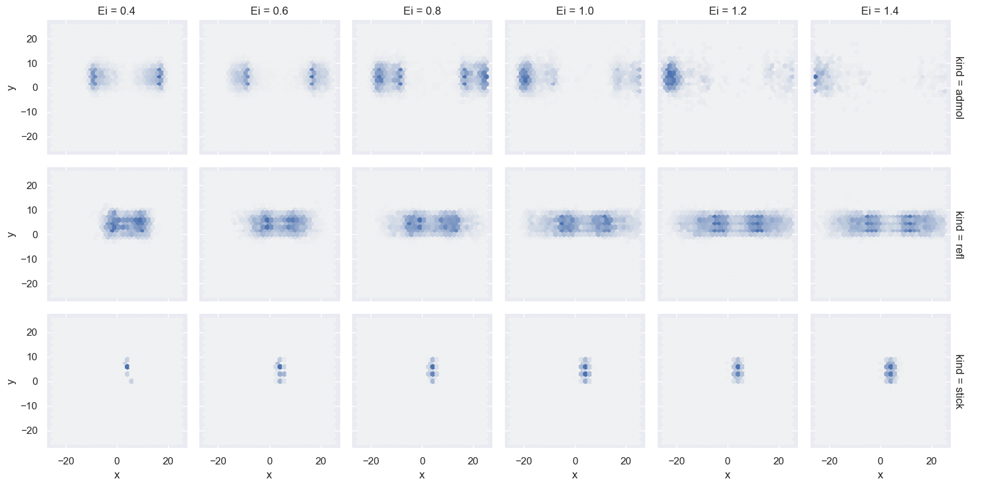

In [23]:

g = sns.FacetGrid(CMs.query('T == 50'), row="kind", col="Ei", margin_titles=True, height=2.5)
g.map(hexbin,'x','y', extent=[-25, 25, -25, 25]) 
g.add_legend()

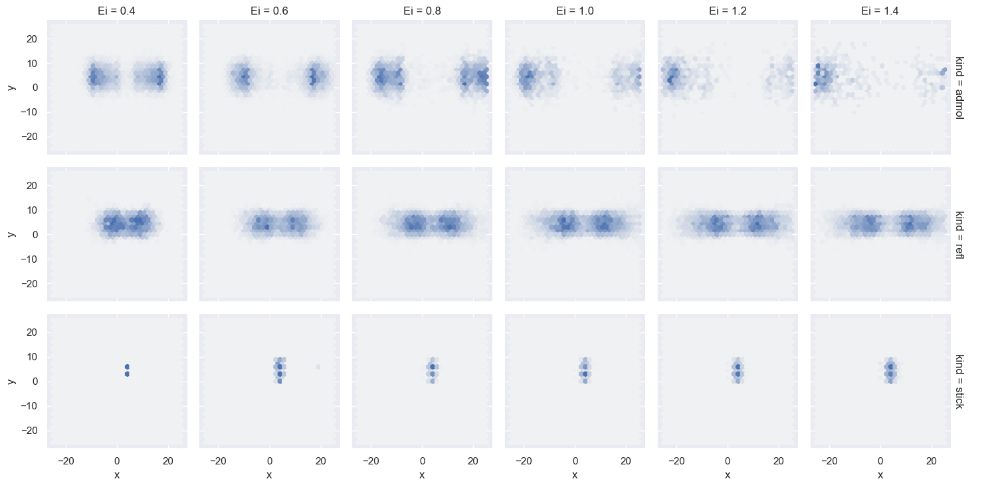

In [24]:

g = sns.FacetGrid(CMs.query('T == 300'), row="kind", col="Ei", margin_titles=True, height=2.5)
g.map(hexbin,'x','y', extent=[-25, 25, -25, 25]) 
g.add_legend()

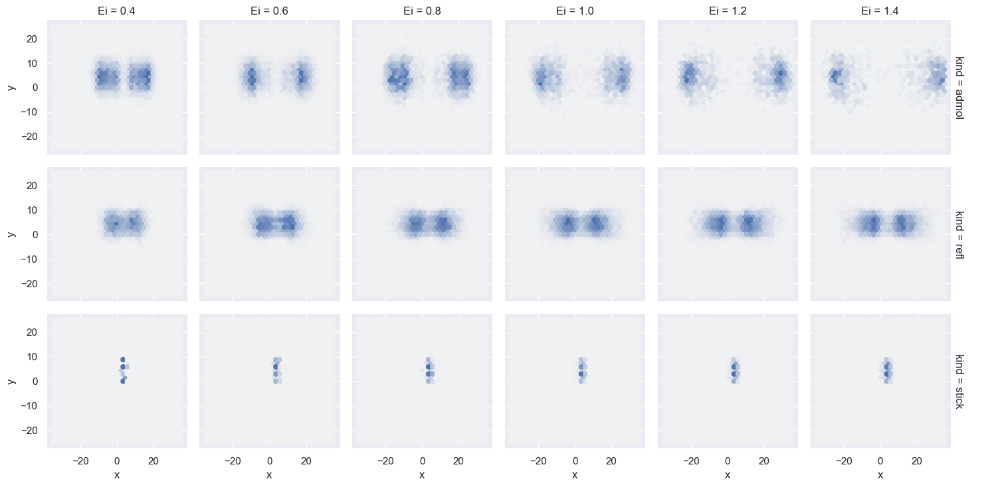

In [25]:

g = sns.FacetGrid(CMs.query('T == 550'), row="kind", col="Ei", margin_titles=True, height=2.5)
g.map(hexbin,'x','y', extent=[-35, 35, -25, 25]) 
g.add_legend()

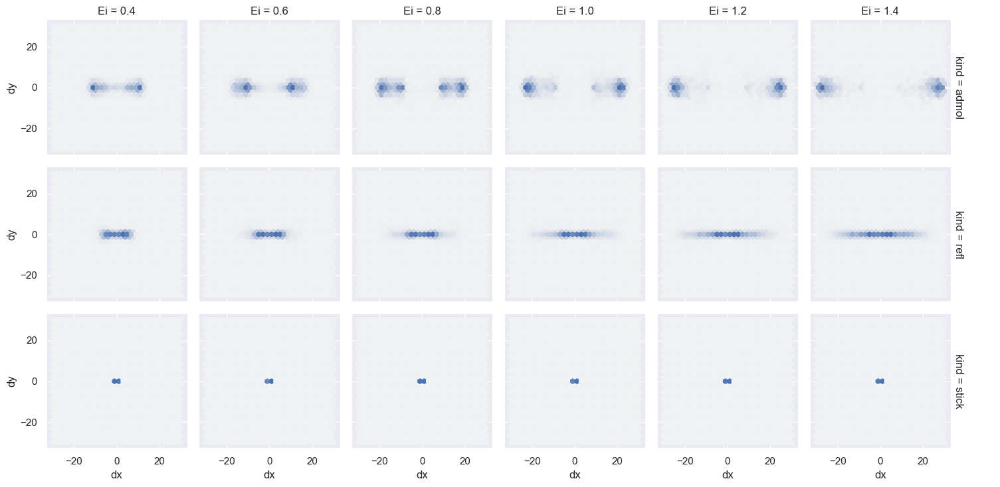

In [26]:
with sns.axes_style("darkgrid"):
    g = sns.FacetGrid(CMs.query('T == 50'), row="kind", col="Ei", margin_titles=True, height=2.5)
    g.map(hexbin,'dx','dy', extent=[-30, 30, -30, 30]) 
    g.add_legend()

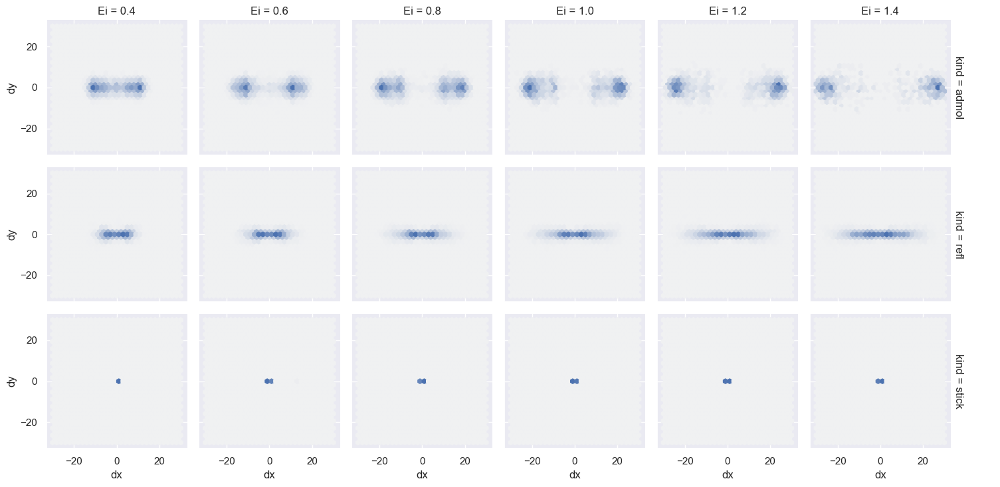

In [27]:

g = sns.FacetGrid(CMs.query('T == 300'), row="kind", col="Ei", margin_titles=True, height=2.5)
g.map(hexbin,'dx','dy', extent=[-30, 30, -30, 30]) 
g.add_legend()

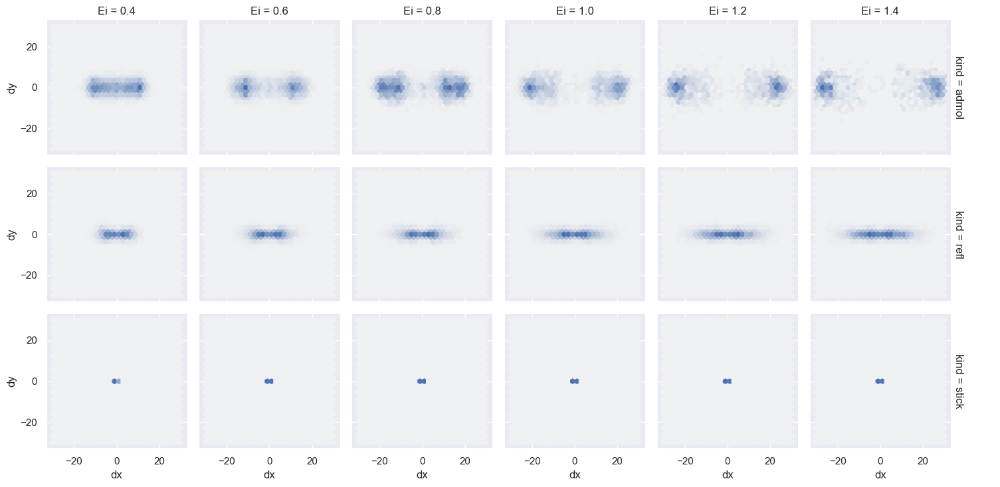

In [28]:

g = sns.FacetGrid(CMs.query('T == 550'), row="kind", col="Ei", margin_titles=True, height=2.5)
g.map(hexbin,'dx','dy', extent=[-30, 30, -30, 30]) 
g.add_legend()

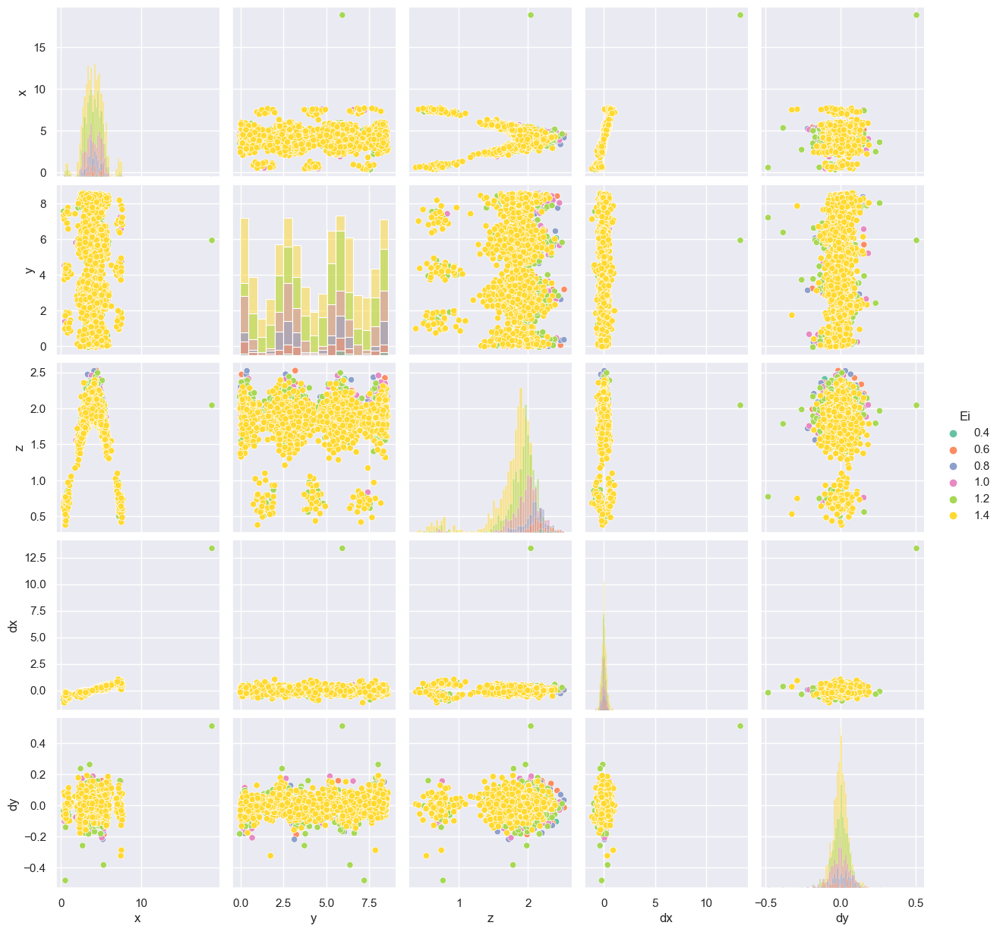

In [29]:
data = CMs.query('T==50 & kind=="stick" ')
g = sns.pairplot(data,vars=['x',	'y',	'z',	'dx',	'dy'], hue="Ei", palette="Set2", diag_kind="hist", height=2.5)

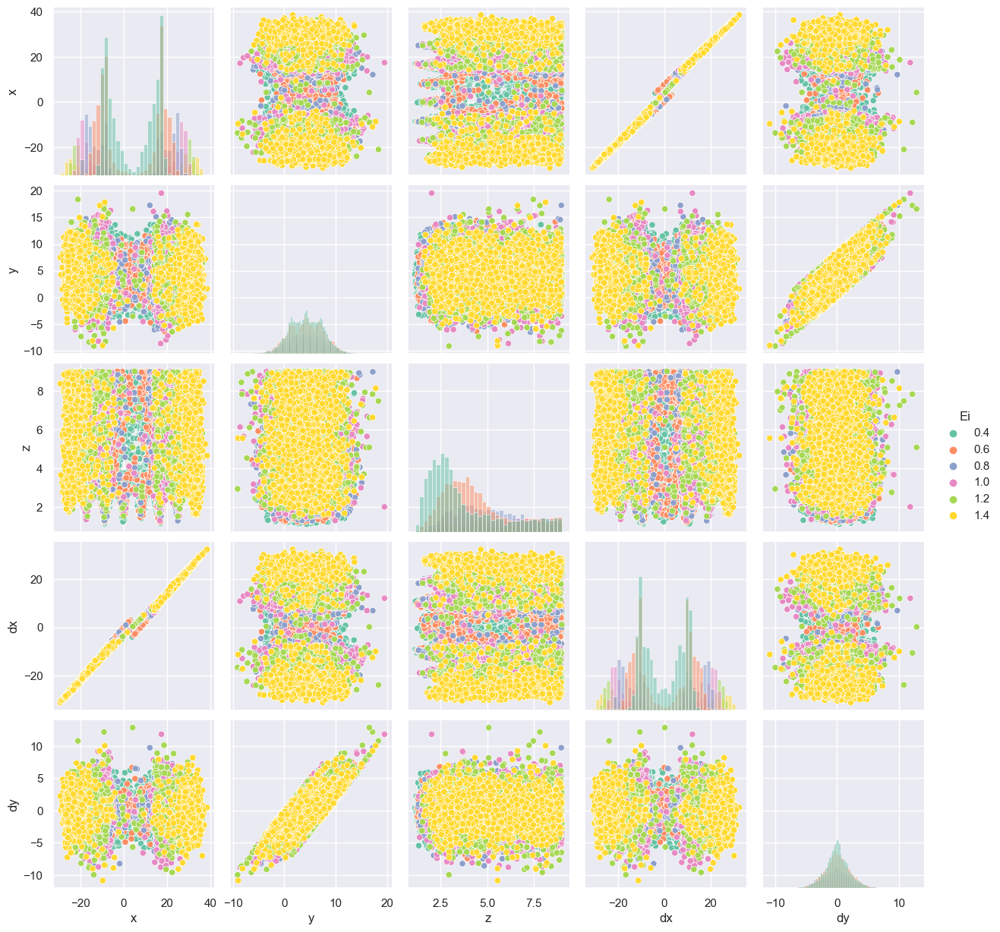

In [30]:
data = CMs.query('T==50 & kind=="admol" ')
g = sns.pairplot(data,vars=['x',	'y',	'z',	'dx',	'dy'], hue="Ei", palette="Set2", diag_kind="hist", height=2.5)

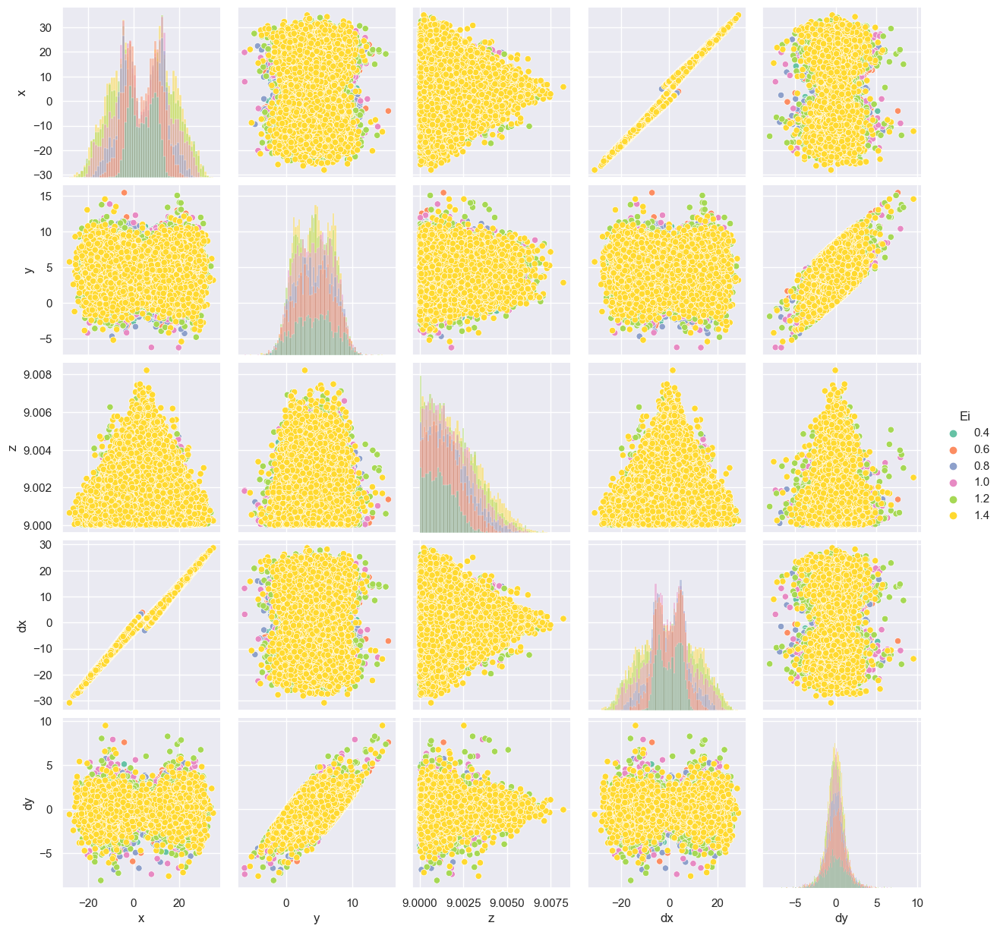

In [31]:
data = CMs.query('T==50 & kind=="refl" ')
g = sns.pairplot(data,vars=['x',	'y',	'z',	'dx',	'dy'], hue="Ei", palette="Set2", diag_kind="hist", height=2.5)

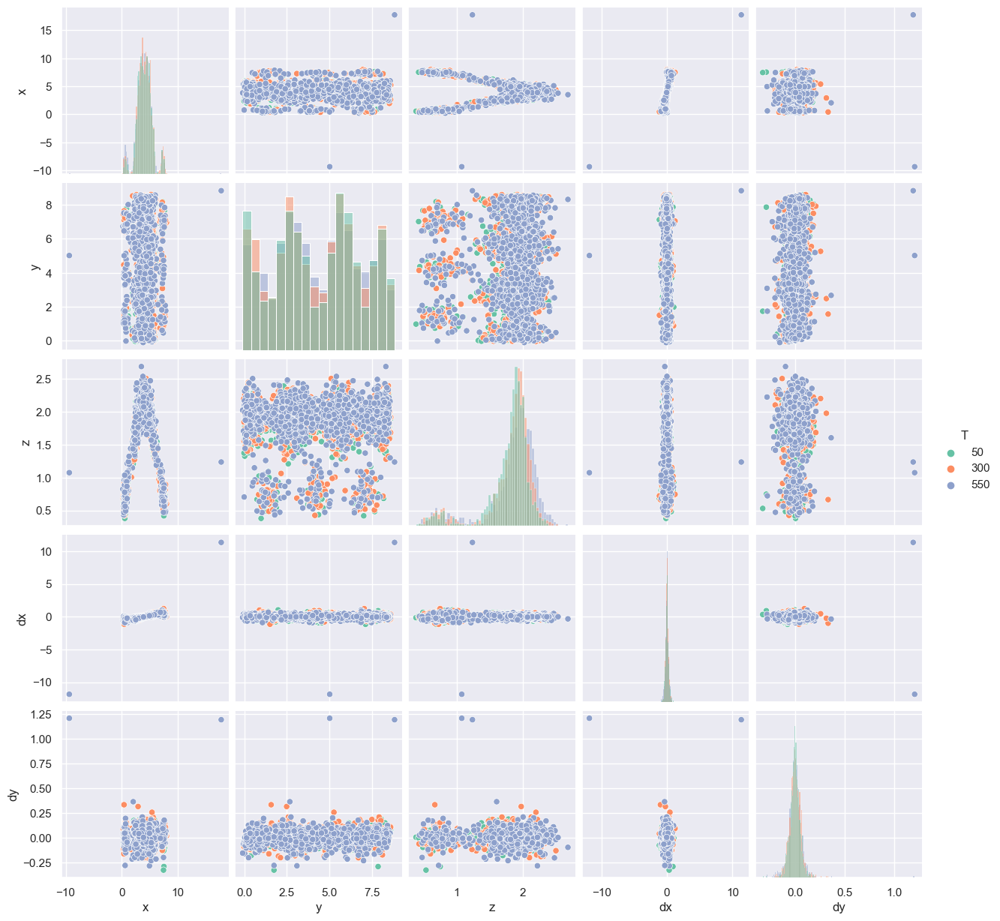

In [32]:
data = CMs.query('Ei=="1.4" & kind=="stick" ')
g = sns.pairplot(data,vars=['x',	'y',	'z',	'dx',	'dy'], hue="T", palette="Set2", diag_kind="hist", height=2.5)

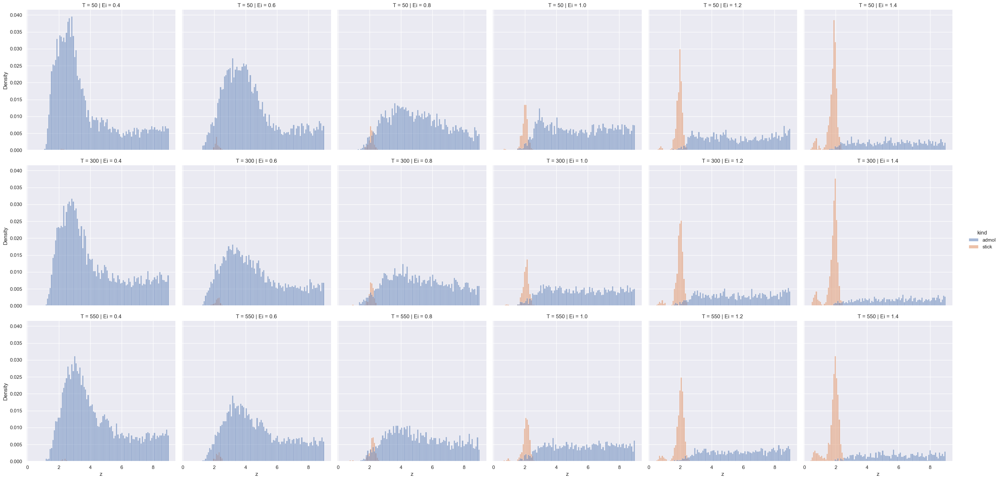

In [33]:
sns.displot(data=CMs.query('kind != "refl"'), x="z", hue="kind", col="Ei", row='T', bins=100, stat='density')

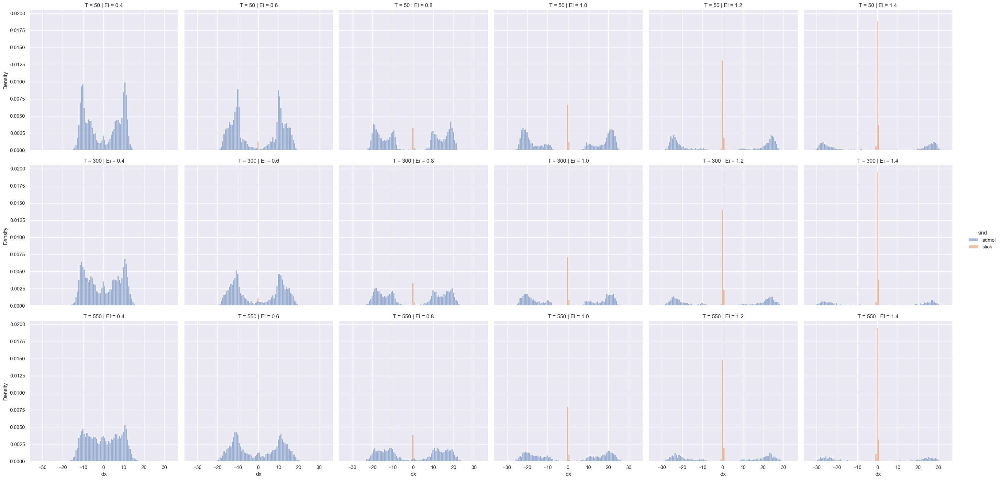

In [34]:
sns.displot(data=CMs.query('kind != "refl"'), x="dx", hue="kind", col="Ei", row='T', bins=100, stat='density')

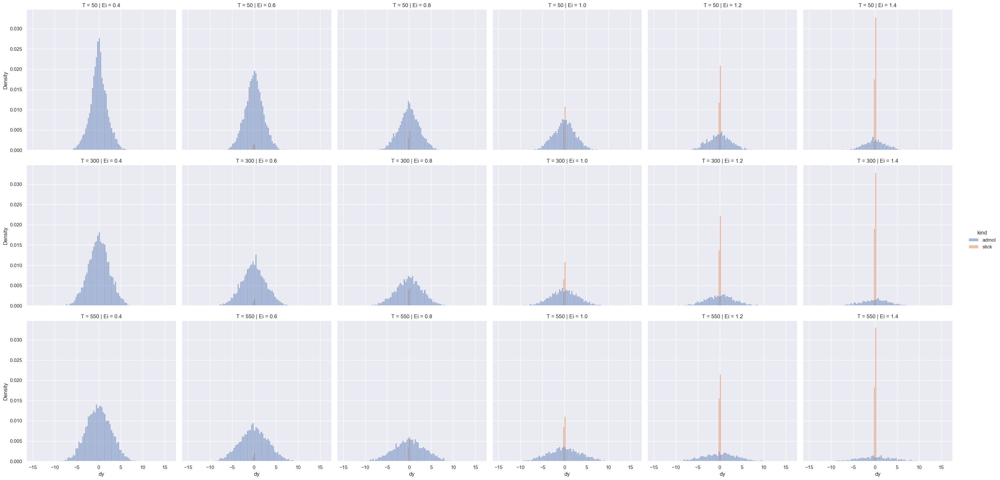

In [35]:
sns.displot(data=CMs.query('kind != "refl"'), x="dy", hue="kind", col="Ei", row='T', bins=100, stat='density')

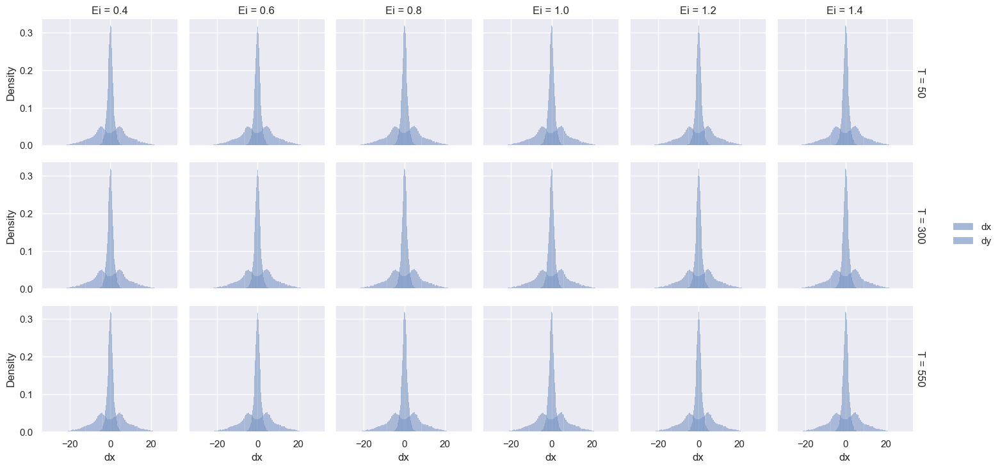

In [36]:
g = sns.FacetGrid(CMs, row="T", col="Ei", margin_titles=True, height=2.5)
g.map(sns.histplot,data=CMs.query('kind == "refl"'), x="dx", hue="kind", bins=100, stat='density',color='red',label='dx') 
g.map(sns.histplot,data=CMs.query('kind == "refl"'), x="dy", hue="kind", bins=100, stat='density',color='blue',label='dy') 
g.add_legend()

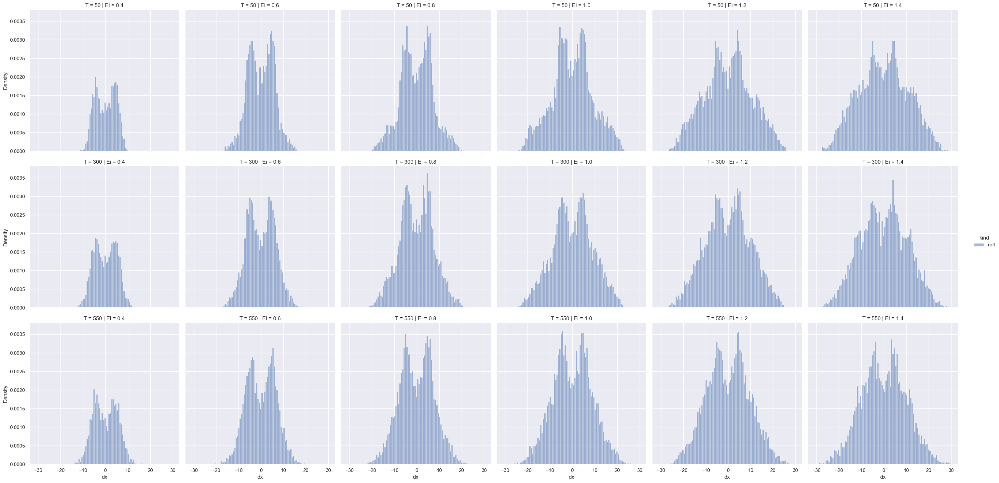

In [37]:
sns.displot(data=CMs.query('kind == "refl"'), x="dx", hue="kind", col="Ei", row='T', bins=100, stat='density')

## Disociación sobre atomo de Pt

In [38]:
trajs_all_stick

,ncoup,nt,t,nreb,nsubh,ptad,V,Ei,kind,T
0,2321,1510,0.3018,0,4,51,0.935684,0.4,stick,50
1,3384,1502,0.3002,0,4,49,1.049950,0.4,stick,50
2,3525,1610,0.3218,1,4,51,1.337092,0.4,stick,50
3,3611,1535,0.3068,0,1,49,1.287614,0.4,stick,50
4,5257,1504,0.3006,0,4,51,0.955718,0.4,stick,50
...,...,...,...,...,...,...,...,...,...,...
8245,9966,998,0.1994,1,4,51,3.587370,1.4,stick,550
8246,9980,895,0.1788,1,1,50,3.367813,1.4,stick,550
8247,9988,907,0.1812,0,3,49,3.354040,1.4,stick,550
8248,9993,1000,0.1998,1,2,50,2.708475,1.4,stick,550


In [39]:
dPt_stick = dPt.query('kind == "stick"')
dPt_stick

,ntraj,nat,dx,dy,dz,Ei,kind,T
0,2321,31,0.057324,-0.029630,-0.014623,0.4,stick,50
1,2321,32,0.038994,-0.050930,-0.024849,0.4,stick,50
2,2321,33,0.058371,-0.033094,-0.046881,0.4,stick,50
3,2321,34,0.006967,-0.054592,-0.011560,0.4,stick,50
4,2321,35,0.022585,0.006333,-0.010755,0.4,stick,50
...,...,...,...,...,...,...,...,...
3631105,9879,47,-0.088285,0.460123,-0.051751,1.4,stick,550
3631106,9879,48,-0.074423,0.257100,0.037956,1.4,stick,550
3631107,9879,49,-0.103517,0.359508,0.322479,1.4,stick,550
3631108,9879,50,0.015749,0.515746,0.155656,1.4,stick,550


In [40]:
df_stick = pd.merge(trajs_all_stick, dPt_stick , left_on=['T', 'Ei', 'ncoup', 'ptad'], right_on=['T', 'Ei', 'ntraj','nat'])
df_stick

,ncoup,nt,t,nreb,nsubh,ptad,V,Ei,kind_x,T,ntraj,nat,dx,dy,dz,kind_y
0,2321,1510,0.3018,0,4,51,0.935684,0.4,stick,50,2321,51,0.075253,-0.004670,0.139315,stick
1,3384,1502,0.3002,0,4,49,1.049950,0.4,stick,50,3384,49,0.027453,-0.136301,0.045059,stick
2,3525,1610,0.3218,1,4,51,1.337092,0.4,stick,50,3525,51,0.017758,0.027674,0.074649,stick
3,3611,1535,0.3068,0,1,49,1.287614,0.4,stick,50,3611,49,-0.008771,0.158637,0.098002,stick
4,5257,1504,0.3006,0,4,51,0.955718,0.4,stick,50,5257,51,-0.025945,0.058823,0.012909,stick
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8271,9966,998,0.1994,1,4,51,3.587370,1.4,stick,550,9966,51,-0.117910,-0.359715,0.122281,stick
8272,9980,895,0.1788,1,1,50,3.367813,1.4,stick,550,9980,50,-0.047303,0.277008,0.196774,stick
8273,9988,907,0.1812,0,3,49,3.354040,1.4,stick,550,9988,49,-0.001546,0.571940,0.085672,stick
8274,9993,1000,0.1998,1,2,50,2.708475,1.4,stick,550,9993,50,-0.180344,-0.004562,-0.004063,stick


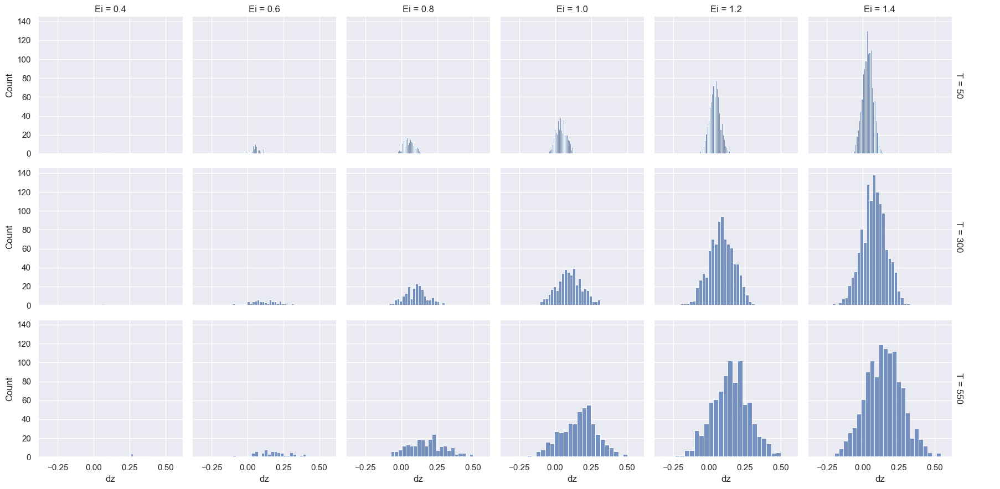

In [41]:
with sns.axes_style("darkgrid"):
    g = sns.FacetGrid(df_stick, row="T", col="Ei", margin_titles=True)
    g.map(sns.histplot,'dz', bins=25) 
    g.add_legend()

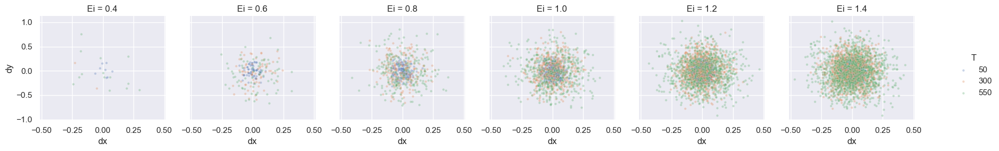

In [42]:
with sns.axes_style("darkgrid"):
    g = sns.FacetGrid(df_stick, hue="T", col="Ei", margin_titles=True)
    g.map(sns.scatterplot,'dx','dy', s=10,alpha=0.3) 
    g.add_legend()

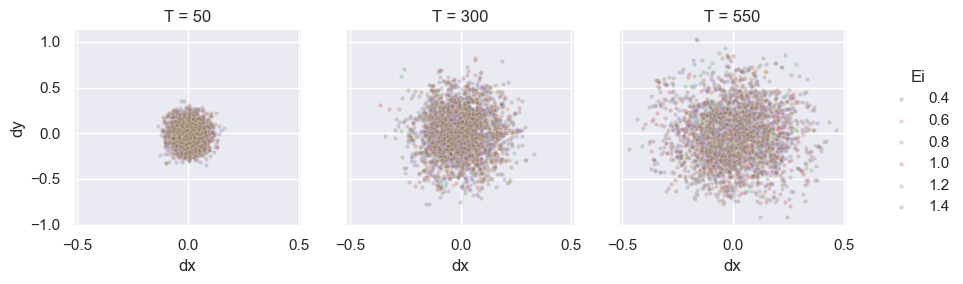

In [43]:
with sns.axes_style("darkgrid"):
    g = sns.FacetGrid(df_stick, hue="Ei", col="T", margin_titles=True)
    g.map(sns.scatterplot,'dx','dy', s=10,alpha=0.3) 
    g.add_legend()

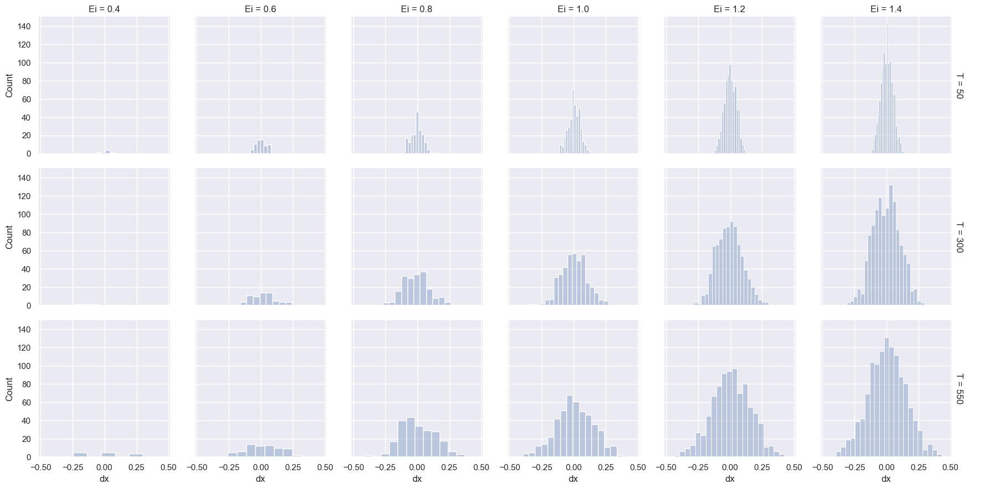

In [44]:
with sns.axes_style("darkgrid"):
    g = sns.FacetGrid(df_stick, row="T", col="Ei", margin_titles=True)
    g.map(sns.histplot,'dx',alpha=0.3) 
    g.add_legend()

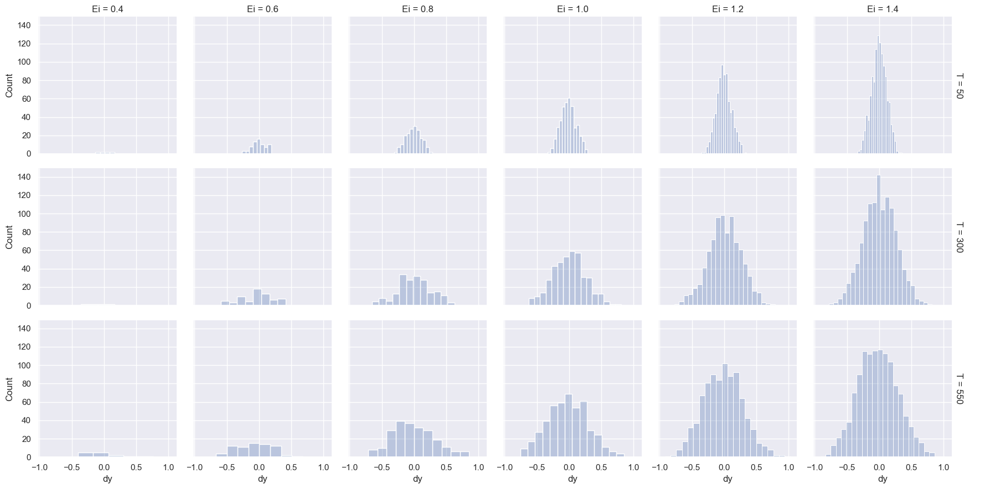

In [45]:
with sns.axes_style("darkgrid"):
    g = sns.FacetGrid(df_stick, row="T", col="Ei", margin_titles=True)
    g.map(sns.histplot,'dy',alpha=0.3) 
    g.add_legend()

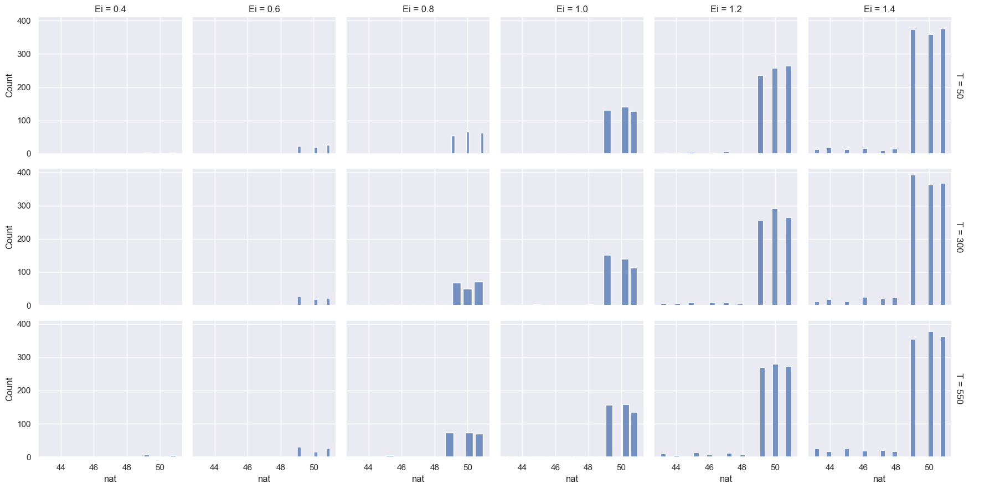

In [46]:
with sns.axes_style("darkgrid"):
    g = sns.FacetGrid(df_stick, row="T", col="Ei", margin_titles=True, despine=False)
    g.map(sns.histplot,'nat', multiple="dodge", shrink=.8) 
    g.add_legend()

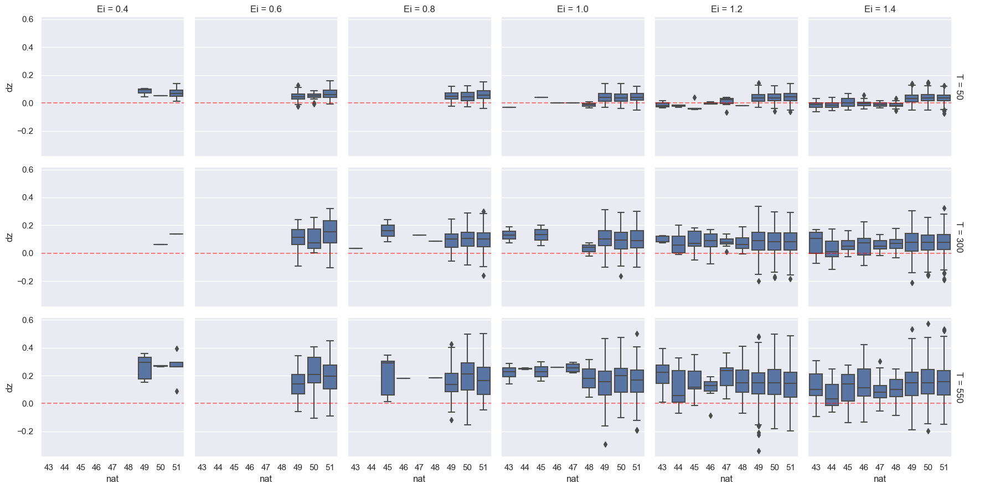

In [47]:
sns.set_theme(style="darkgrid")
g = sns.FacetGrid(df_stick, row="T", col="Ei", margin_titles=True, despine=False)
g.map(sns.boxplot,'nat','dz', order=[43,44,45,46,47,48,49,50,51]) 
g.refline(y=0, color='red',alpha=0.5)
g.tight_layout()
g.add_legend()

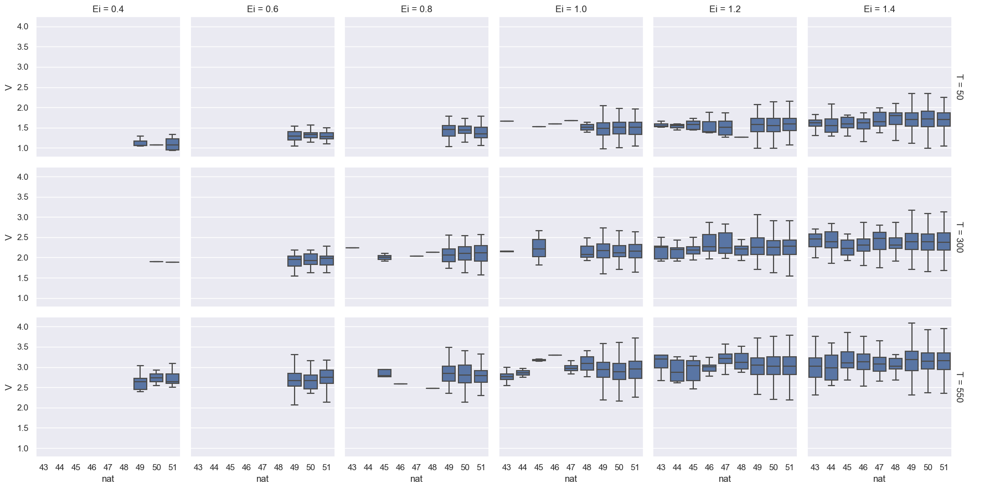

In [48]:
sns.set_theme(style="darkgrid")
g = sns.FacetGrid(df_stick, row="T", col="Ei", margin_titles=True, despine=False)
g.map(sns.boxplot,'nat','V', sym="", order=[43,44,45,46,47,48,49,50,51]) 
g.add_legend()

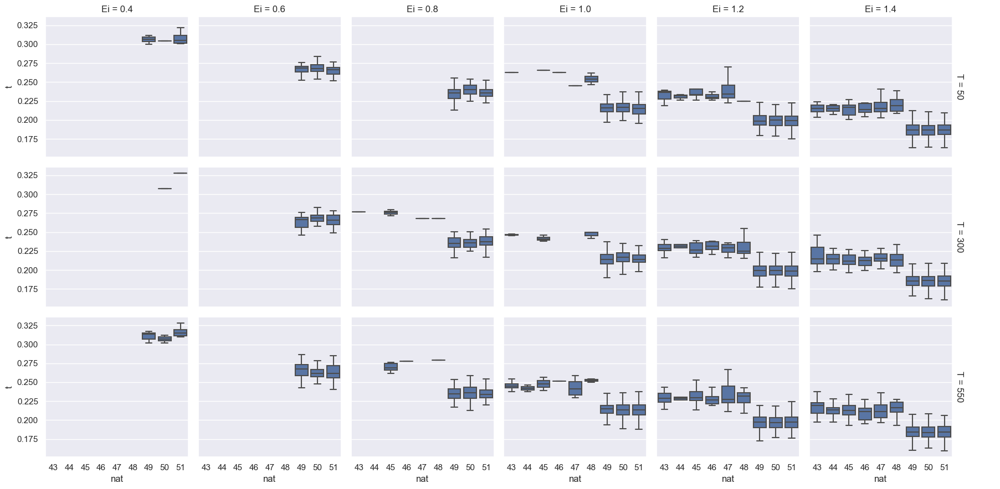

In [49]:
sns.set_theme(style="darkgrid")
g = sns.FacetGrid(df_stick, row="T", col="Ei", margin_titles=True, despine=False)
g.map(sns.boxplot,'nat','t', sym="", order=[43,44,45,46,47,48,49,50,51]) 
g.add_legend()

In [50]:
df_stick.nat.unique()

array([51, 49, 50, 48, 46, 43, 47, 45, 44], dtype=int64)

In [51]:
import numpy as np

# Suponiendo que df es tu DataFrame
df_stick['capa'] = np.where((df_stick['nat'] >= 49) & (df_stick['nat'] <= 51), 'Ridge', 'Facet')
df_stick

,ncoup,nt,t,nreb,nsubh,ptad,V,Ei,kind_x,T,ntraj,nat,dx,dy,dz,kind_y,capa
0,2321,1510,0.3018,0,4,51,0.935684,0.4,stick,50,2321,51,0.075253,-0.004670,0.139315,stick,Ridge
1,3384,1502,0.3002,0,4,49,1.049950,0.4,stick,50,3384,49,0.027453,-0.136301,0.045059,stick,Ridge
2,3525,1610,0.3218,1,4,51,1.337092,0.4,stick,50,3525,51,0.017758,0.027674,0.074649,stick,Ridge
3,3611,1535,0.3068,0,1,49,1.287614,0.4,stick,50,3611,49,-0.008771,0.158637,0.098002,stick,Ridge
4,5257,1504,0.3006,0,4,51,0.955718,0.4,stick,50,5257,51,-0.025945,0.058823,0.012909,stick,Ridge
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8271,9966,998,0.1994,1,4,51,3.587370,1.4,stick,550,9966,51,-0.117910,-0.359715,0.122281,stick,Ridge
8272,9980,895,0.1788,1,1,50,3.367813,1.4,stick,550,9980,50,-0.047303,0.277008,0.196774,stick,Ridge
8273,9988,907,0.1812,0,3,49,3.354040,1.4,stick,550,9988,49,-0.001546,0.571940,0.085672,stick,Ridge
8274,9993,1000,0.1998,1,2,50,2.708475,1.4,stick,550,9993,50,-0.180344,-0.004562,-0.004063,stick,Ridge


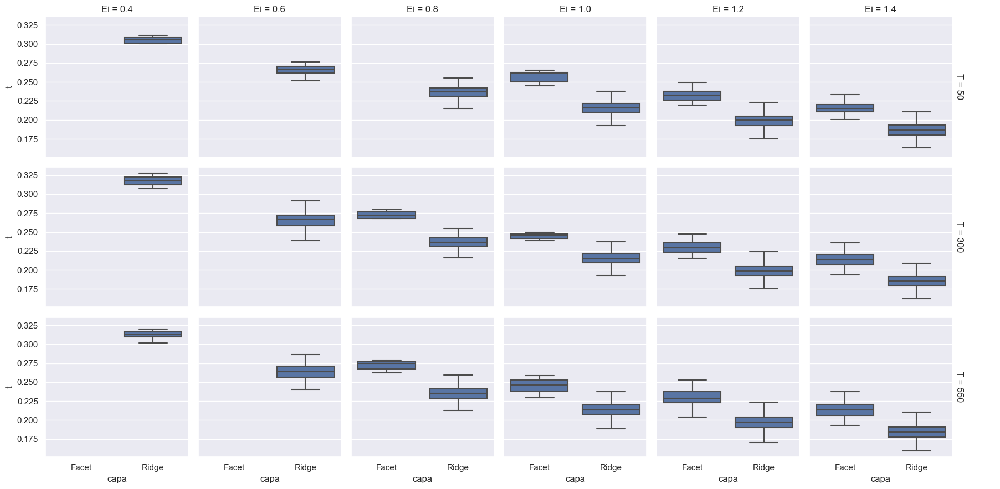

In [52]:
sns.set_theme(style="darkgrid")
g = sns.FacetGrid(df_stick, row="T", col="Ei", margin_titles=True, despine=False)
g.map(sns.boxplot,'capa','t', sym="", order=['Facet','Ridge']) 
g.add_legend()

In [53]:
df_stick.capa.unique()

array(['Ridge', 'Facet'], dtype=object)

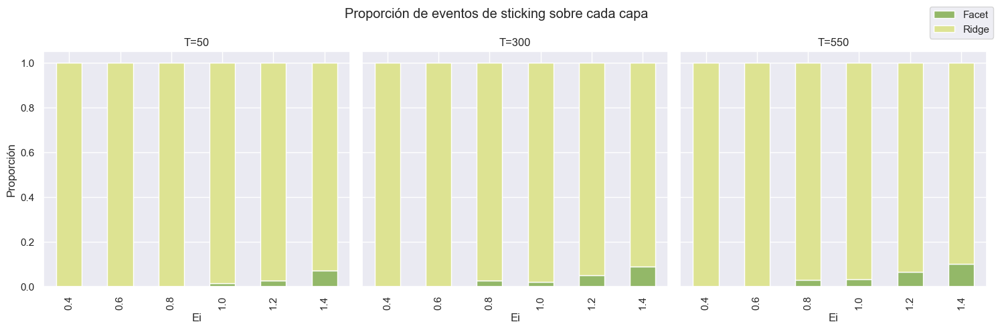

In [54]:
df = df_stick

# Suponiendo que df es tu DataFrame
df['T'] = df['T'].astype(str)  # Convertir la columna 'T' a tipo cadena para facilitar la filtración

# Filtrar el DataFrame para cada valor de 'T'
df_T50 = df[df['T'] == '50']
df_T300 = df[df['T'] == '300']
df_T550 = df[df['T'] == '550']

# Crear subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

# Iterar sobre los DataFrames filtrados y los ejes
for df_temp, ax, temp_label in zip([df_T50, df_T300, df_T550], axs, ['50', '300', '550']):
    grouped_df = df_temp.groupby(['Ei', 'capa']).size().unstack(fill_value=0)

    # Normalizar los datos
    grouped_df = grouped_df.div(grouped_df.sum(axis=1), axis=0)

    # Crear el gráfico de barras apiladas
    grouped_df.plot(kind='bar', stacked=True, color=[ '#93B868','#DDE392'], ax=ax, legend=False)

    # Personalizar el gráfico
    ax.set_title(f'T={temp_label}')
    ax.set_xlabel('Ei')
    ax.set_ylabel('Proporción')
    # ax.set_ylim([0, 0.2])

# Añadir leyenda
fig.legend([ 'Facet','Ridge'], bbox_to_anchor=(1,1))
fig.suptitle('Proporción de eventos de sticking sobre cada capa')
# Ajustar el diseño y mostrar el gráfico
plt.tight_layout()
plt.show()


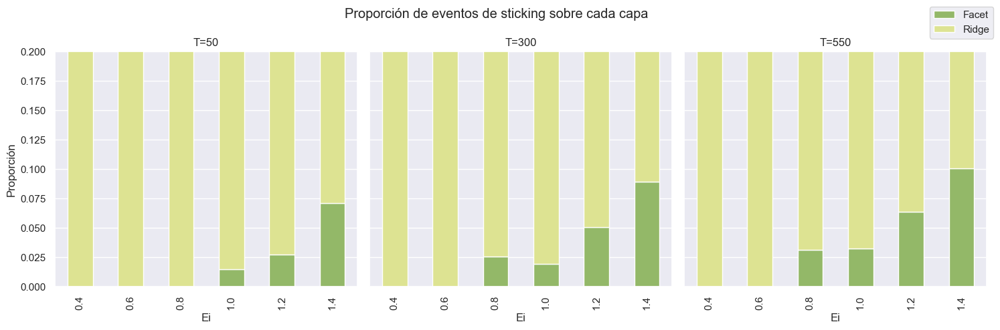

In [55]:
df = df_stick

# Suponiendo que df es tu DataFrame
df['T'] = df['T'].astype(str)  # Convertir la columna 'T' a tipo cadena para facilitar la filtración

# Filtrar el DataFrame para cada valor de 'T'
df_T50 = df[df['T'] == '50']
df_T300 = df[df['T'] == '300']
df_T550 = df[df['T'] == '550']

# Crear subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

# Iterar sobre los DataFrames filtrados y los ejes
for df_temp, ax, temp_label in zip([df_T50, df_T300, df_T550], axs, ['50', '300', '550']):
    grouped_df = df_temp.groupby(['Ei', 'capa']).size().unstack(fill_value=0)

    # Normalizar los datos
    grouped_df = grouped_df.div(grouped_df.sum(axis=1), axis=0)

    # Crear el gráfico de barras apiladas
    grouped_df.plot(kind='bar', stacked=True, color=[ '#93B868','#DDE392'], ax=ax, legend=False)

    # Personalizar el gráfico
    ax.set_title(f'T={temp_label}')
    ax.set_xlabel('Ei')
    ax.set_ylabel('Proporción')
    ax.set_ylim([0, 0.2])

# Añadir leyenda
fig.legend([ 'Facet','Ridge'], bbox_to_anchor=(1,1))

fig.suptitle('Proporción de eventos de sticking sobre cada capa')
# Ajustar el diseño y mostrar el gráfico
plt.tight_layout()
plt.show()


In [56]:
df.head(10).to_clipboard()

In [57]:
count_ridge = df.query('capa =="Ridge"').groupby(['T','Ei']).ncoup.agg('count')
count_ridge

T    Ei 
300  0.4       2
     0.6      66
     0.8     190
     1.0     404
     1.2     812
     1.4    1122
50   0.4       8
     0.6      70
     0.8     185
     1.0     400
     1.2     758
     1.4    1109
550  0.4      14
     0.6      71
     0.8     219
     1.0     450
     1.2     821
     1.4    1096
Name: ncoup, dtype: int64

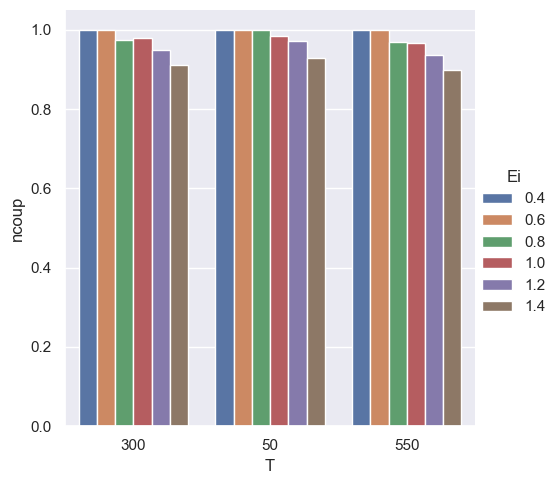

In [58]:
count_ridge = df.query('capa =="Ridge"').groupby(['T','Ei']).ncoup.agg('count')
count = df.groupby(['T','Ei']).ncoup.agg('count')
count_ridge = count_ridge/ count
count_ridge = count_ridge.reset_index()
count_ridge.ncoup.fillna(0, inplace=True)
count_ridge

# Define the order of 'T'
t_order = ['50', '300', '550']
df['T'] = pd.Categorical(df['T'], categories=t_order, ordered=True)

sns.catplot(
    data=count_ridge,
    x = 'T',
    y='ncoup',
    hue = 'Ei',
    kind='bar'
)


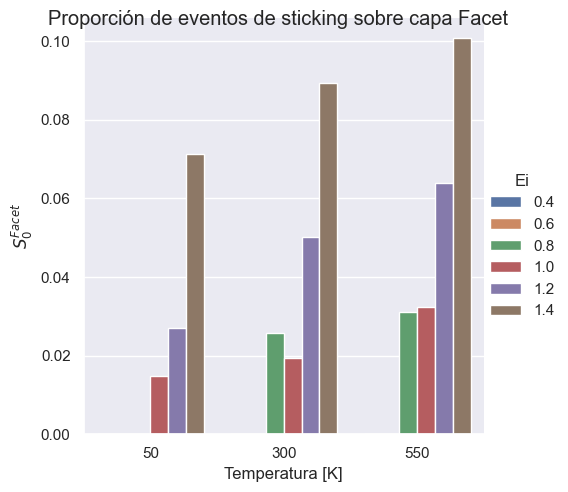

In [59]:
count_facet = df.query('capa =="Facet"').groupby(['T','Ei']).ncoup.agg('count')
count = df.groupby(['T','Ei']).ncoup.agg('count')
count_facet = count_facet/ count
count_facet = count_facet.reset_index()
count_facet.ncoup.fillna(0, inplace=True)
count_facet

# Define the order of 'T'
t_order = ['50', '300', '550']
df['T'] = pd.Categorical(df['T'], categories=t_order, ordered=True)

 
g = sns.catplot(
    data=count_facet,
    x = 'T',
    y='ncoup',
    hue = 'Ei',
    kind='bar'
)

# Personaliza los rótulos de los ejes
g.set_axis_labels('Temperatura [K]', '$S_0^{Facet}$ ')

# Cambia los títulos de las columnas (capa)
g.set_titles(col_template="{col_name}")

plt.suptitle('Proporción de eventos de sticking sobre capa Facet')
plt.show()

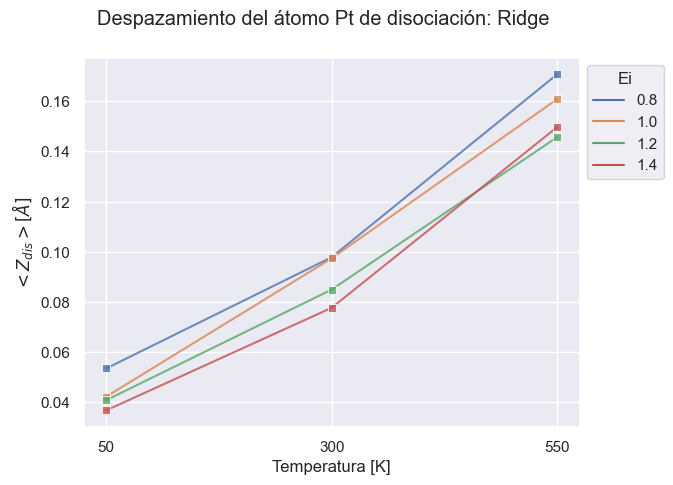

In [60]:
g = sns.lineplot(
    data=df.query('capa =="Ridge" & Ei > "0.6"').groupby(['T','Ei'])[['dz']].agg('mean').reset_index(),
    x='T',
    y='dz',
    hue='Ei',
    marker='s',
    alpha=0.8
)

# Personaliza los rótulos de los ejes
g.set(xlabel='Temperatura [K]', ylabel='$< Z_{dis} > [\AA]$ ')

plt.suptitle('Despazamiento del átomo Pt de disociación: Ridge')
plt.legend(title='Ei',bbox_to_anchor=(1.,1))
# Muestra el gráfico
plt.show()


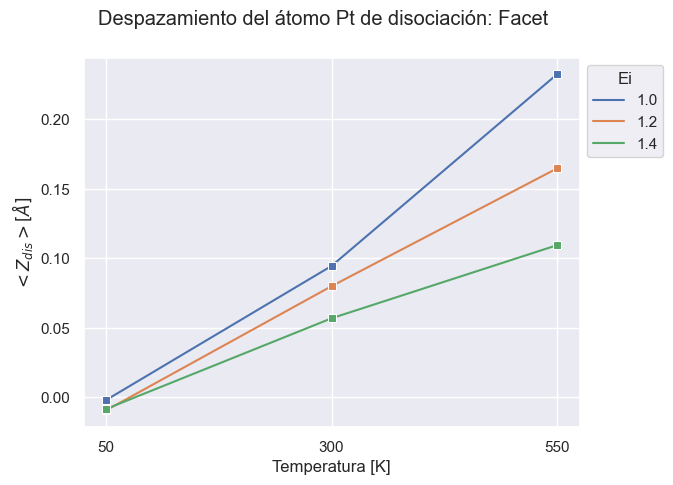

In [61]:
g = sns.lineplot(data = df.query('capa =="Facet" & Ei >= "1.0"').groupby(['T','Ei'])[['dz']].agg('mean').reset_index(),
                x = 'T',
                y = 'dz',
                hue = 'Ei',
                marker='s'
                )
# Personaliza los rótulos de los ejes
g.set(xlabel='Temperatura [K]', ylabel='$< Z_{dis} > [\AA]$ ')

plt.suptitle('Despazamiento del átomo Pt de disociación: Facet')
plt.legend(title='Ei',bbox_to_anchor=(1,1))
# Muestra el gráfico
plt.show()


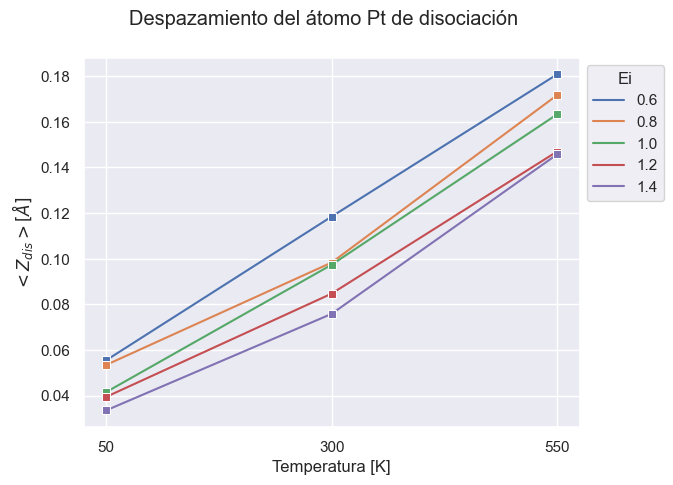

In [62]:

g = sns.lineplot(data = df.query(' Ei > "0.4"').groupby(['T','Ei'])[['dz']].agg('mean').reset_index(),
                x = 'T',
                y = 'dz',
                hue = 'Ei',
                marker='s'
                ) 

# Personaliza los rótulos de los ejes
g.set(xlabel='Temperatura [K]', ylabel='$< Z_{dis} > [\AA]$ ')

plt.suptitle('Despazamiento del átomo Pt de disociación')
plt.legend(title='Ei',bbox_to_anchor=(1,1))
# Muestra el gráfico
plt.show()


In [63]:
df

,ncoup,nt,t,nreb,nsubh,ptad,V,Ei,kind_x,T,ntraj,nat,dx,dy,dz,kind_y,capa
0,2321,1510,0.3018,0,4,51,0.935684,0.4,stick,50,2321,51,0.075253,-0.004670,0.139315,stick,Ridge
1,3384,1502,0.3002,0,4,49,1.049950,0.4,stick,50,3384,49,0.027453,-0.136301,0.045059,stick,Ridge
2,3525,1610,0.3218,1,4,51,1.337092,0.4,stick,50,3525,51,0.017758,0.027674,0.074649,stick,Ridge
3,3611,1535,0.3068,0,1,49,1.287614,0.4,stick,50,3611,49,-0.008771,0.158637,0.098002,stick,Ridge
4,5257,1504,0.3006,0,4,51,0.955718,0.4,stick,50,5257,51,-0.025945,0.058823,0.012909,stick,Ridge
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8271,9966,998,0.1994,1,4,51,3.587370,1.4,stick,550,9966,51,-0.117910,-0.359715,0.122281,stick,Ridge
8272,9980,895,0.1788,1,1,50,3.367813,1.4,stick,550,9980,50,-0.047303,0.277008,0.196774,stick,Ridge
8273,9988,907,0.1812,0,3,49,3.354040,1.4,stick,550,9988,49,-0.001546,0.571940,0.085672,stick,Ridge
8274,9993,1000,0.1998,1,2,50,2.708475,1.4,stick,550,9993,50,-0.180344,-0.004562,-0.004063,stick,Ridge


In [64]:
df['Ei'].astype('float')
df['V-Ei'] = df['V'] - df['Ei'].astype('float')
df

,ncoup,nt,t,nreb,nsubh,ptad,V,Ei,kind_x,T,ntraj,nat,dx,dy,dz,kind_y,capa,V-Ei
0,2321,1510,0.3018,0,4,51,0.935684,0.4,stick,50,2321,51,0.075253,-0.004670,0.139315,stick,Ridge,0.535684
1,3384,1502,0.3002,0,4,49,1.049950,0.4,stick,50,3384,49,0.027453,-0.136301,0.045059,stick,Ridge,0.649950
2,3525,1610,0.3218,1,4,51,1.337092,0.4,stick,50,3525,51,0.017758,0.027674,0.074649,stick,Ridge,0.937092
3,3611,1535,0.3068,0,1,49,1.287614,0.4,stick,50,3611,49,-0.008771,0.158637,0.098002,stick,Ridge,0.887614
4,5257,1504,0.3006,0,4,51,0.955718,0.4,stick,50,5257,51,-0.025945,0.058823,0.012909,stick,Ridge,0.555718
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8271,9966,998,0.1994,1,4,51,3.587370,1.4,stick,550,9966,51,-0.117910,-0.359715,0.122281,stick,Ridge,2.187370
8272,9980,895,0.1788,1,1,50,3.367813,1.4,stick,550,9980,50,-0.047303,0.277008,0.196774,stick,Ridge,1.967813
8273,9988,907,0.1812,0,3,49,3.354040,1.4,stick,550,9988,49,-0.001546,0.571940,0.085672,stick,Ridge,1.954040
8274,9993,1000,0.1998,1,2,50,2.708475,1.4,stick,550,9993,50,-0.180344,-0.004562,-0.004063,stick,Ridge,1.308475


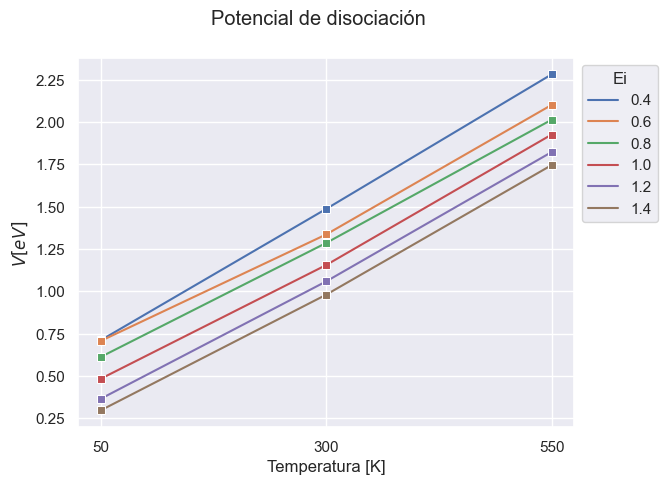

In [65]:

g = sns.lineplot(data = df.query(' Ei >= "0.4"').groupby(['T','Ei'])[['V-Ei']].agg('mean').reset_index(),
                x = 'T',
                y = 'V-Ei',
                hue = 'Ei',
                marker='s'
                ) 

# Personaliza los rótulos de los ejes
g.set(xlabel='Temperatura [K]', ylabel='$ V  [eV]$ ')

plt.suptitle('Potencial de disociación')
plt.legend(title='Ei',bbox_to_anchor=(1,1))
# Muestra el gráfico
plt.show()


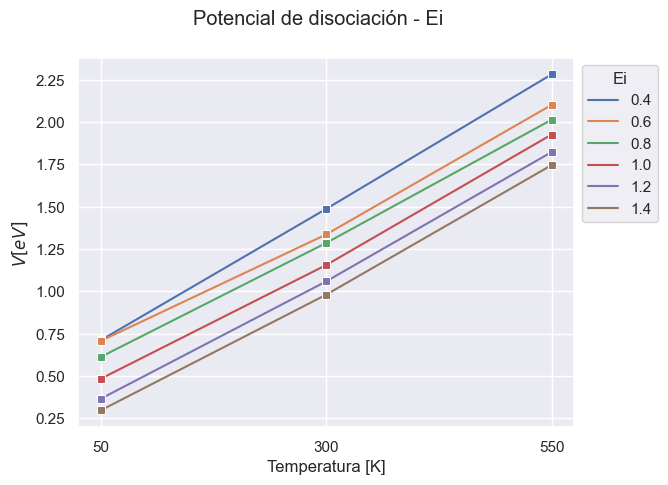

In [66]:

g = sns.lineplot(data = df.query(' Ei >= "0.4"').groupby(['T','Ei'])[['V-Ei']].agg('mean').reset_index(),
                x = 'T',
                y = 'V-Ei',
                hue = 'Ei',
                marker='s'
                ) 

# Personaliza los rótulos de los ejes
g.set(xlabel='Temperatura [K]', ylabel='$ V  [eV]$ ')

plt.suptitle('Potencial de disociación - Ei')
plt.legend(title='Ei',bbox_to_anchor=(1,1))
# Muestra el gráfico
plt.show()
